# *deepBreaks* applications
## Novel insights of niche associations in the oral microbiome   
In this study we are trying to use 1006 nucleotide sequences to train predictive models for predicting a niches of Haemophilus parainfluenzae which in this study are tongue dorsum, buccal mucosa, and supragingival plaque.  
After that, we use the top 3 models to study their feature importances and merge their results. We cover all three steps of preprocessing, modelling, and interpretaion of the models. Finally we vizualize the results of the models and prioritize the most imposrtant sites of the sequences.
<p style="text-align:center;">
<figure>
  <img src="../img/hmp/fig1.png" alt="Niches" style="width: 400px;">
    <figcaption>Image from: <a size=10 href=https://doi.org/10.1038/nature23889>Lloyd-Price, J., Mahurkar, A., Rahnavard, G. et al. Strains, functions and dynamics in the expanded Human Microbiome Project. Nature 550, 61–66 (2017)</a> 
        </figcaption>
</figure>
</p>

In [1]:
# importing deepBreaks libraries 
from deepBreaks.utils import get_models, get_scores, get_params, make_pipeline
from deepBreaks.preprocessing import MisCare, ConstantCare, URareCare, CustomOneHotEncoder
from deepBreaks.preprocessing import FeatureSelection, CollinearCare, CustomStandardScaler
from deepBreaks.preprocessing import read_data, balanced_classes
from deepBreaks.models import model_compare_cv, finalize_top, importance_from_pipe, mean_importance, summarize_results
from deepBreaks.visualization import plot_scatter, dp_plot, plot_imp_model, plot_imp_all
import warnings
import datetime
import os

In [2]:
warnings.filterwarnings("ignore")
warnings.simplefilter('ignore')

In [3]:
# defining user params, file pathes, analysis type

# path to sequences
seqFileName = '../../deepBreaks_data/hmp/s__Haemophilus_parainfluenzae.tsv'

# path to metadata
metaDataFileName = '../../deepBreaks_data/hmp/my_HMP_metadata.tsv'

# name of the phenotype
mt = 'Body_site'

# type of the sequences
seq_type = 'nu'
# type of the analysis if it is a classification model, then we put cl instead of reg
ana_type = 'cl'
sampleFrac=1

In [4]:
# making a unique directory for saving the reports of the analysis
print('direcory preparation')
dt_label = datetime.datetime.now().strftime('%Y-%m-%d_%H-%M-%S')
seqFile = seqFileName.split('.')[0]
report_dir = str(seqFile +'_' + mt + '_' + dt_label)
os.makedirs(report_dir)

direcory preparation


In [5]:
%%time
# importing sequences data
print('reading meta-data')
# importing metadata
meta_data = read_data(metaDataFileName, seq_type = None, is_main=False)

# importing sequences data
print('reading fasta file')
tr = read_data(seqFileName, seq_type = seq_type, is_main=True, gap_threshold=0.7)

# selecting only the classes with enough number of samples
tr = balanced_classes(dat=tr, meta_dat=meta_data, feature=mt)

tr = tr.merge(meta_data.loc[:, mt],  left_index=True, right_index=True, how='inner')
y = tr.loc[:, mt].values
tr.drop(mt, axis=1, inplace=True)
print('Shape of data is: ', tr.shape)

reading meta-data
reading fasta file
Shape of data is:  (1006, 49839)
CPU times: user 1min 17s, sys: 4.37 s, total: 1min 21s
Wall time: 1min 22s


In [6]:
tr.shape

(1006, 49839)

**Attention**: metadata and sequences data should have the names as their row names and for each sequence their must be a value in the meta data file.

In [7]:
print('metadata looks like this:')
meta_data.head()

metadata looks like this:


,Body_area,Body_site,Gender
SRS011061,Gut,Stool,Female
SRS011084,Gut,Stool,Male
SRS011086,Oral,Tongue_dorsum,Female
SRS011090,Oral,Buccal_mucosa,Female
SRS011098,Oral,Supragingival_plaque,Female


In [8]:
print('sequence data looks like this:')
tr.head()

sequence data looks like this:


,p1,p2,p3,p4,p5,p6,p7,p8,p9,p10,p11,p12,p13,p14,p15,p16,p17,p18,p19,p20,p21,p22,p23,p24,p25,p26,p27,p28,p29,p30,p31,p32,p33,p34,p35,p36,p37,p38,p39,p40,...,p49800,p49801,p49802,p49803,p49804,p49805,p49806,p49807,p49808,p49809,p49810,p49811,p49812,p49813,p49814,p49815,p49816,p49817,p49818,p49819,p49820,p49821,p49822,p49823,p49824,p49825,p49826,p49827,p49828,p49829,p49830,p49831,p49832,p49833,p49834,p49835,p49836,p49837,p49838,p49839
SRS011086,A,T,T,T,G,C,A,A,C,A,G,A,A,G,A,A,A,T,C,G,C,T,T,A,T,T,T,G,G,C,G,G,G,G,G,A,A,T,T,A,...,C,G,T,C,A,A,G,T,A,G,G,T,G,G,C,A,G,C,A,A,A,T,G,G,C,A,A,C,T,G,T,T,A,T,T,T,C,A,T,C
SRS011098,A,T,T,T,G,C,A,A,C,A,G,A,A,G,A,A,A,T,C,G,C,T,T,A,T,T,T,G,G,C,G,G,G,G,G,A,A,T,T,A,...,C,G,T,C,A,A,G,T,C,G,G,C,G,G,C,A,G,C,A,A,A,T,G,G,C,A,A,C,T,G,T,T,A,T,T,T,C,A,T,C
SRS011115,A,T,T,T,G,C,A,A,C,A,G,A,A,G,A,A,A,T,C,G,C,T,T,A,T,T,T,G,G,C,A,G,G,G,G,A,A,T,T,A,...,C,G,T,C,A,A,G,T,A,G,G,T,G,G,C,A,G,C,A,A,A,T,G,G,C,A,A,C,T,G,T,T,A,T,T,T,C,A,T,C
SRS011126,A,T,T,T,G,C,A,A,C,A,G,A,A,G,A,A,A,T,C,G,C,T,T,A,T,T,T,G,G,C,G,G,G,G,G,A,A,T,T,A,...,C,G,T,C,A,A,G,T,C,G,G,C,G,G,C,A,G,C,A,A,A,T,G,G,C,A,A,C,T,G,T,T,A,T,T,T,C,A,T,C
SRS011140,A,T,T,T,G,C,A,A,C,A,G,A,A,G,A,A,A,T,C,G,C,T,T,A,T,T,T,G,G,C,G,G,G,G,G,A,A,T,T,A,...,C,G,T,C,A,A,G,T,A,G,G,T,G,G,C,A,G,C,A,A,A,T,G,G,C,A,A,C,T,G,T,T,A,T,T,T,C,A,T,C


In [9]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
y = le.fit_transform(y)
print(le.classes_)

['Buccal_mucosa' 'Supragingival_plaque' 'Tongue_dorsum']


### Preprocessing
In this step, we do all these steps:
1. dropping columns with a number of missing values above a certain threshold  
2. dropping zero entropy columns  
3. imputing missing values with the mode of that column  
4. replacing cases with a frequency below a threshold (default 1.5%) with the mode of that column
5. dropping zero entropy columns
6. use statistical tests (each position against the phenotype) and drop columns with p-values below a threshold (default 0.25)
7. one-hot encode the remaining columns
8. calculate the pair-wise distance matrix for all of the columns
9. use the distance matrix for DBSCAN and cluster the correlated positions together
10. keep only one column (closes to center of each cluster) for each group and drop the rest from the training data set

In [10]:
prep_pipeline = make_pipeline(
    steps=[
        ('mc', MisCare(missing_threshold=0.05)),
        ('cc', ConstantCare()),
        ('ur', URareCare(threshold=0.05)),
        ('cc2', ConstantCare()),
        ('one_hot', CustomOneHotEncoder()),
        ('feature_selection', FeatureSelection(model_type=ana_type, alpha=0.25, keep=True)),
        ('st_sc', CustomStandardScaler()),
        ('collinear_care', CollinearCare(dist_method='correlation', threshold=0.25, keep=True))
    ])

In [11]:
%%time
#separate_CV
tr_p = prep_pipeline.fit_transform(tr, y)

CPU times: user 4min 26s, sys: 5.82 s, total: 4min 32s
Wall time: 4min 33s


In [12]:
%%time
report, top = model_compare_cv(X=tr, y=y, preprocess_pipe=prep_pipeline,
                               models_dict=get_models(ana_type=ana_type),
                               scoring=get_scores(ana_type=ana_type),
                               report_dir=report_dir,
                               cv=0.25, ana_type=ana_type, cache_dir=report_dir)

Fitting rf...


/Users/mbagh/opt/anaconda3/envs/dptest_scale/lib/python3.9/site-packages/sklearn/pipeline.py:359: UserWarning: Persisting input arguments took 68.99s to run.If this happens often in your code, it can cause performance problems (results will be correct in all cases). The reason for this is probably some large input arguments for a wrapped function.
  X, fitted_transformer = fit_transform_one_cached(


Fitting Adaboost...
Fitting et...
Fitting lg...
Fitting gbc...
Fitting dt...
Fitting xgb...
Fitting lgbm...
CPU times: user 15.1 s, sys: 17 s, total: 32 s
Wall time: 47min 15s


In [13]:
report

,Accuracy,AUC,F1,Recall,Precision
et,0.865079,0.953207,0.850890,0.849909,0.853623
gbc,0.861111,0.954688,0.849045,0.848847,0.850421
lgbm,0.861111,0.955334,0.847095,0.846897,0.848397
xgb,0.861111,0.960181,0.846202,0.845078,0.849570
rf,0.857143,0.949323,0.841305,0.840247,0.844767
lg,0.853175,0.948657,0.839991,0.840483,0.841464
dt,0.785714,0.830310,0.765547,0.765895,0.765850
Adaboost,0.738095,0.914448,0.737782,0.738723,0.762904


In [14]:
%%time
top = finalize_top(X=tr, y=y, top_models=top, grid_param={},report_dir=report_dir, cv=10)

Tuning et...
Tuning gbc...
Tuning lgbm...
CPU times: user 12min 28s, sys: 18.2 s, total: 12min 46s
Wall time: 12min 33s


In [15]:
n_positions = prep_pipeline.named_steps['mc'].get_n_features_in()
grouped_features = prep_pipeline.named_steps['collinear_care'].get_feature_grouped_dict()
p_values = prep_pipeline.named_steps['feature_selection'].get_p_values()
corr_mat = prep_pipeline.named_steps['collinear_care'].get_corr()

In [16]:
%%time
sr = summarize_results(top_models=top, report_dir=report_dir)

CPU times: user 3min 19s, sys: 2.06 s, total: 3min 21s
Wall time: 3min 27s


In [17]:
sr.head()

,feature,p_value,score,et,gbc,lgbm,mean
0,p1_GAP,0.001385,13.163465,0.045455,0.0,0.000000,0.015152
1,p2_T,0.311402,2.333343,0.000000,0.0,0.000000,0.000000
2,p3_T,0.311402,2.333343,0.000000,0.0,0.000000,0.000000
3,p4_GAP,0.002952,11.650252,0.045455,0.0,0.000000,0.015152
4,p4_T,0.131264,4.061090,0.008994,0.0,0.028846,0.012614


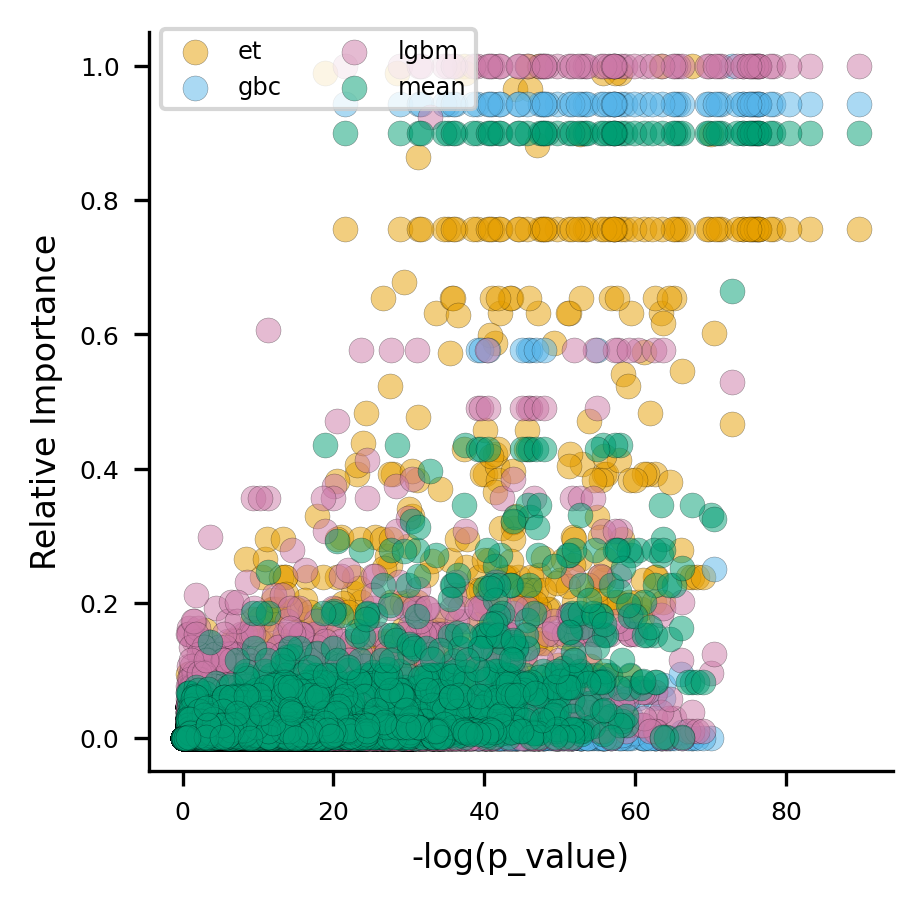

In [18]:
scatter_plot = plot_scatter(summary_result=sr, report_dir=report_dir)

In [20]:
%%time
mean_imp = mean_importance(top, report_dir=report_dir, aggregate_function='max')

CPU times: user 2.88 s, sys: 113 ms, total: 2.99 s
Wall time: 3.08 s


mean Done


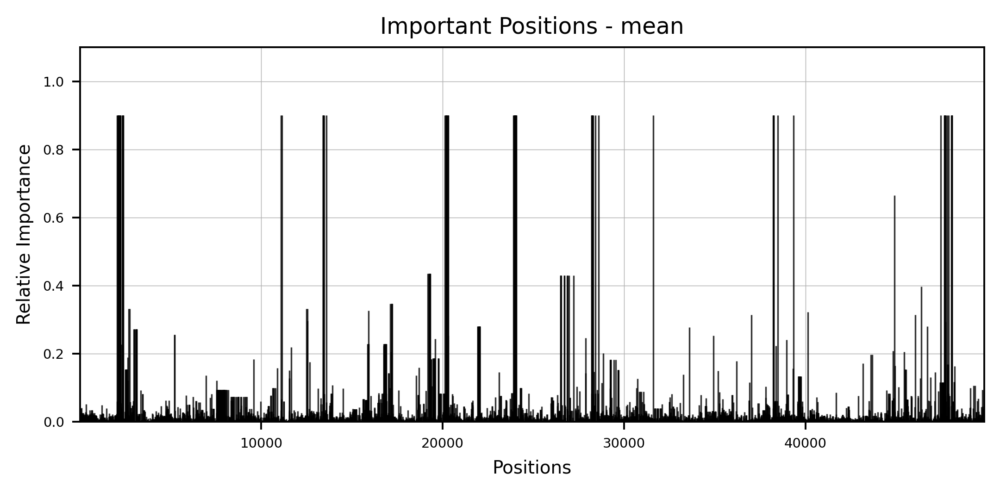

In [22]:
dp_plot(importance=mean_imp,imp_col='mean', model_name='mean', report_dir=report_dir, annotate=0)

In [23]:
tr = prep_pipeline[:4].fit_transform(tr)
y = le.inverse_transform(y)

et Done
et  Done
gbc Done
gbc  Done
lgbm Done
lgbm  Done


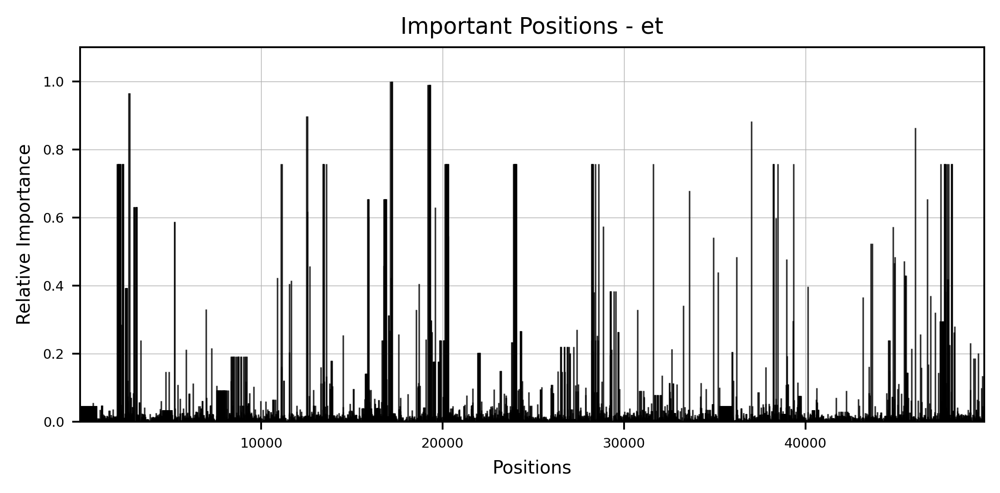

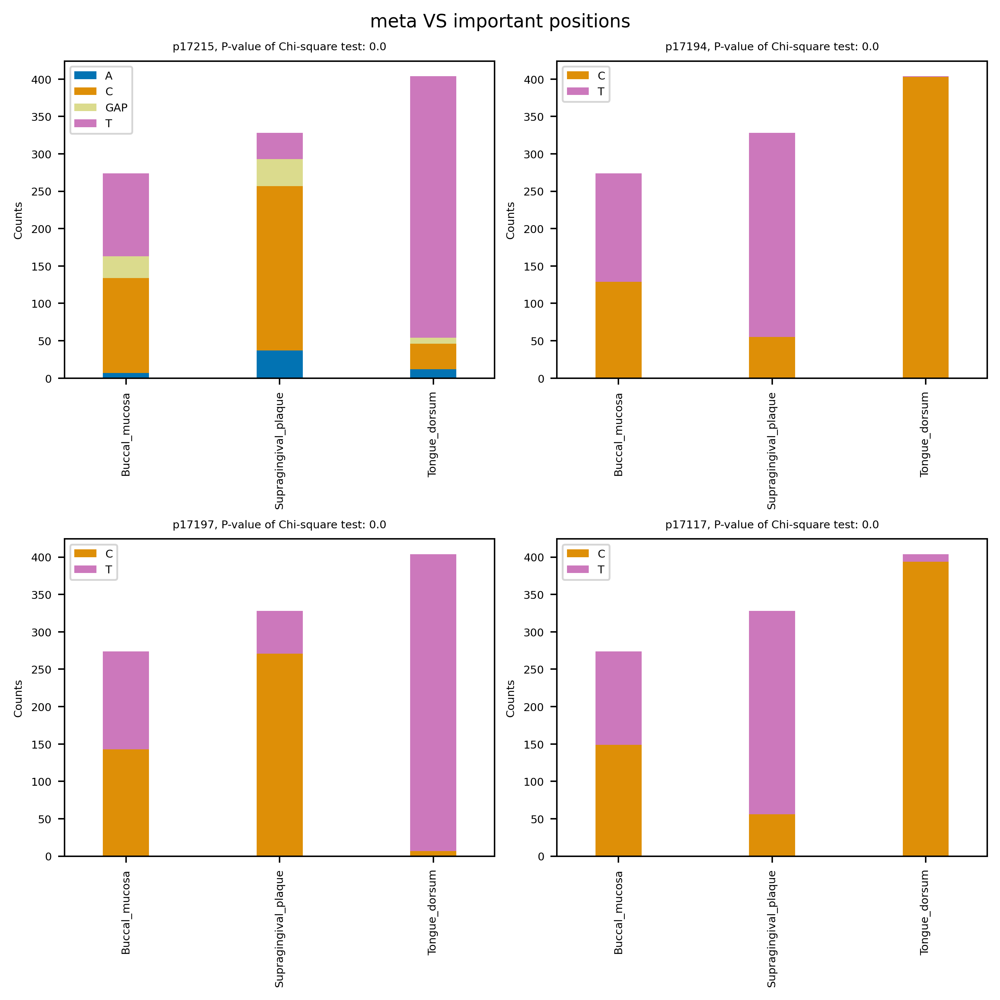

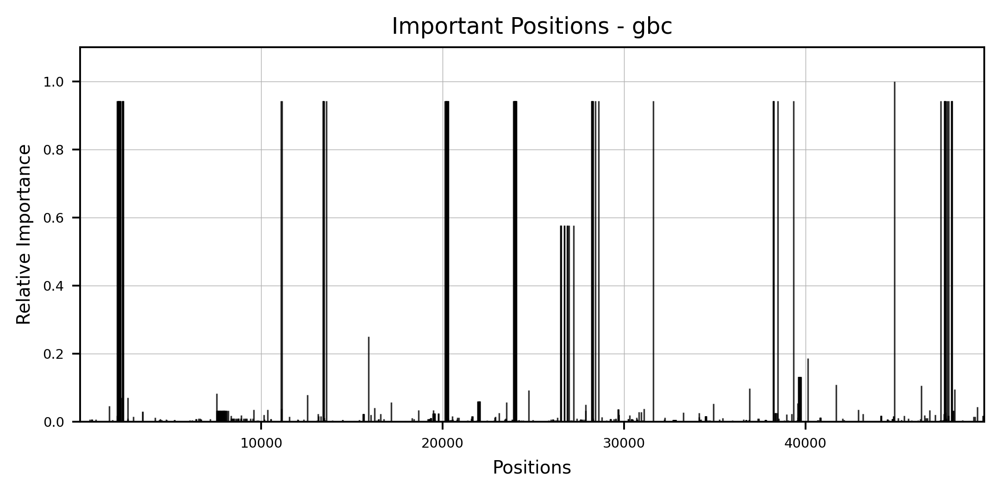

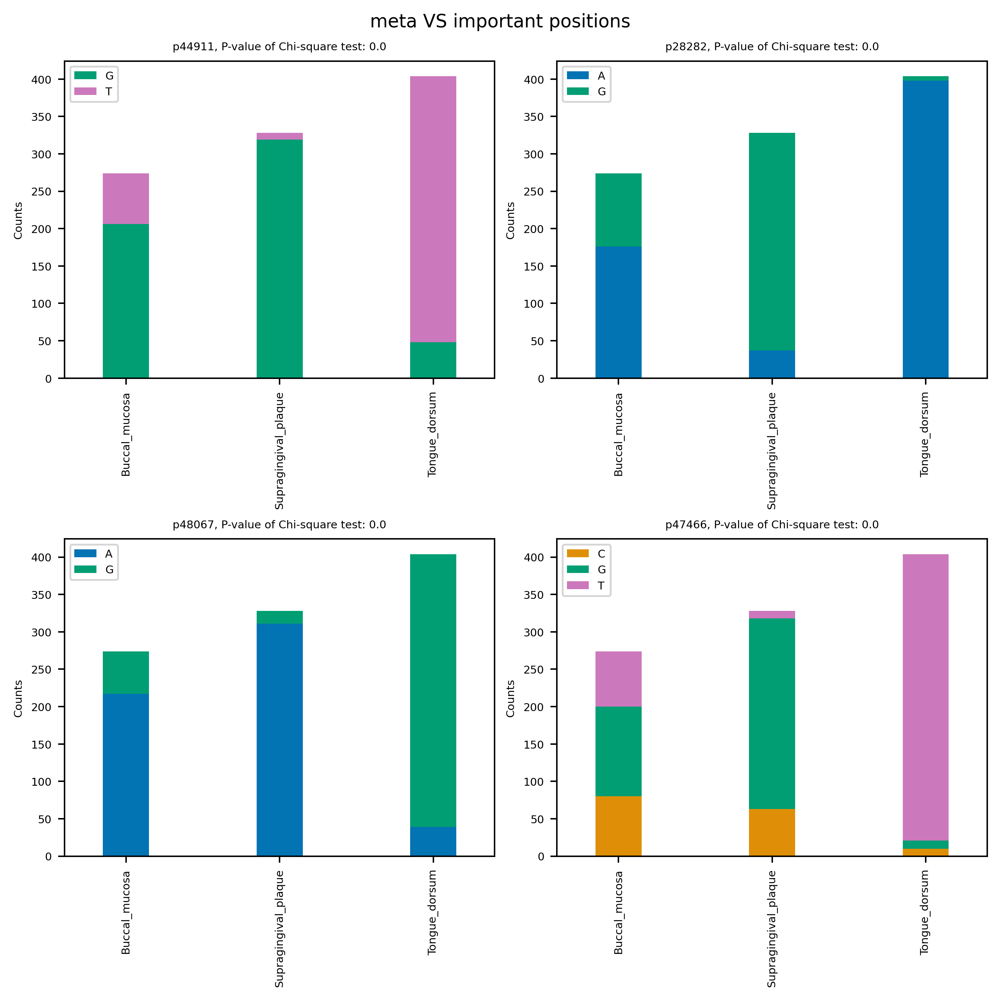

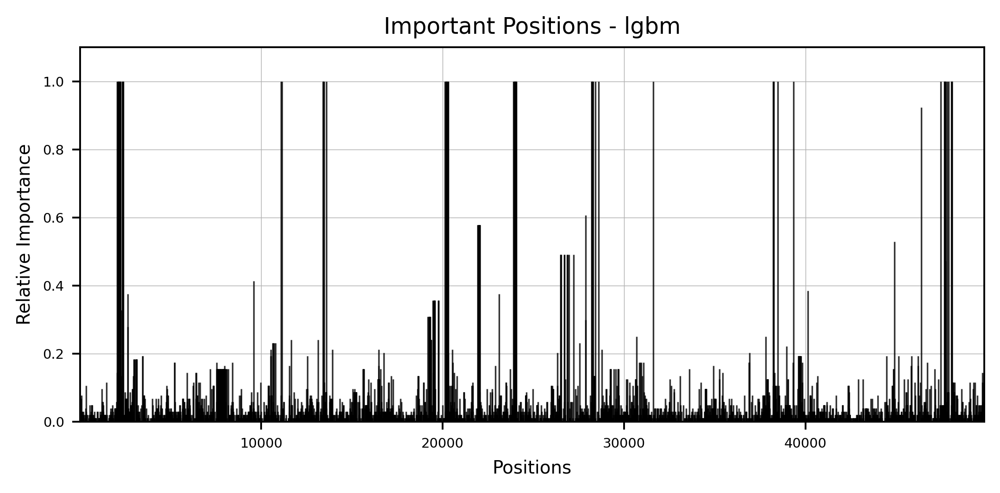

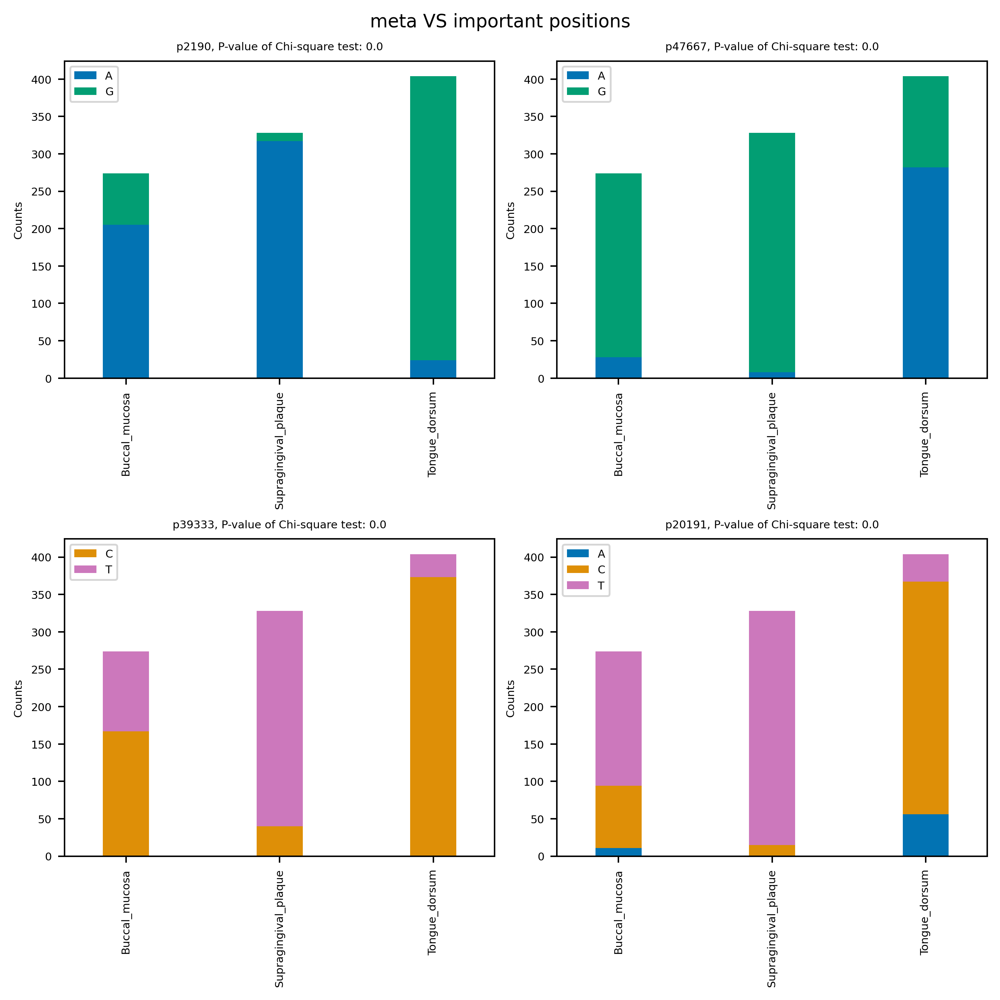

In [24]:
for model in top:
    model_name = model.steps[-1][0]
    dp_plot(importance=importance_from_pipe(model, aggregate_function='max'),
            annotate=0,
            imp_col='standard_value',
            model_name = model_name, report_dir=report_dir)
    
    plot_imp_model(importance=importance_from_pipe(model, aggregate_function='max'), 
               X_train=tr, y_train=y, model_name=model_name,
                   meta_var='meta', model_type=ana_type, report_dir=report_dir)

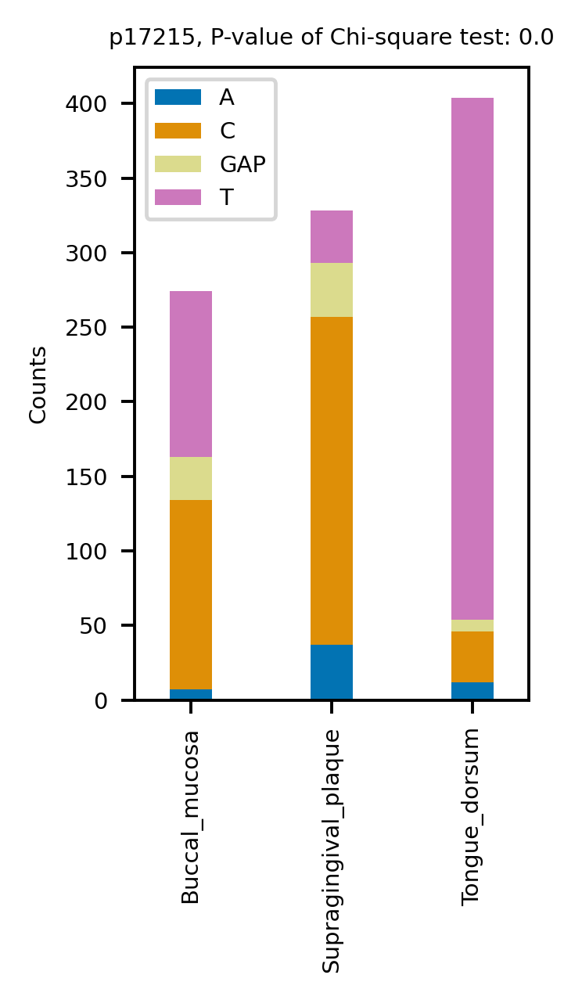

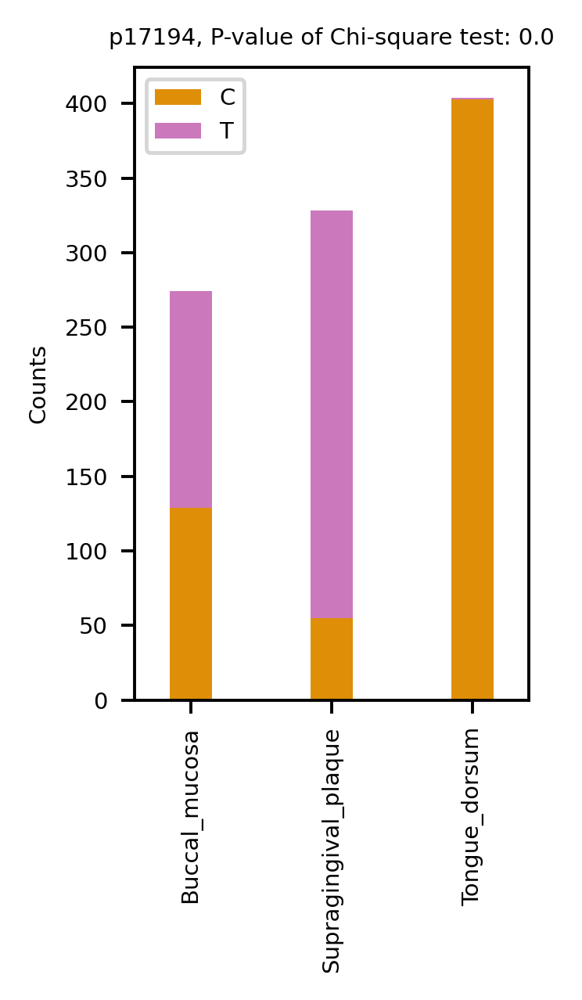

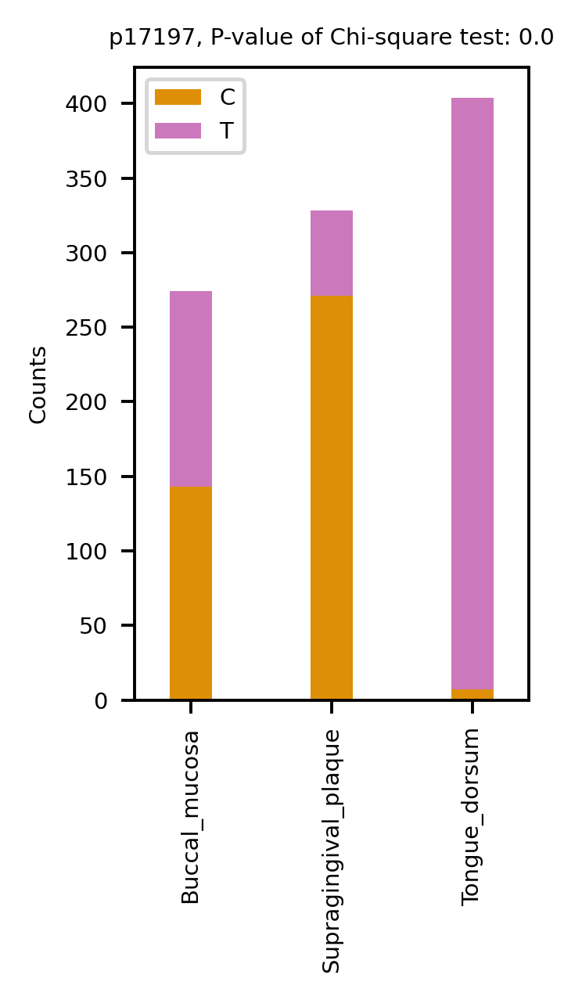

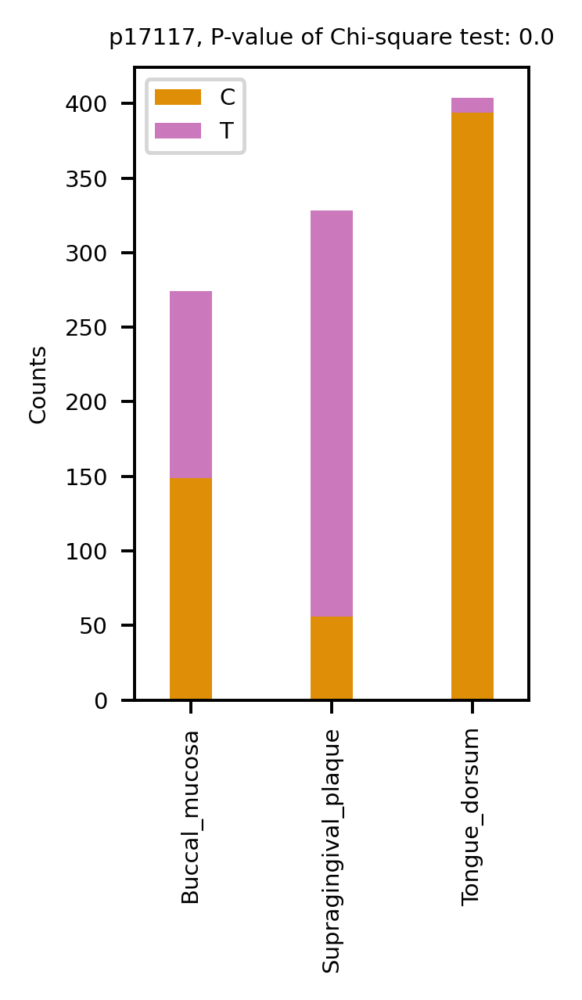

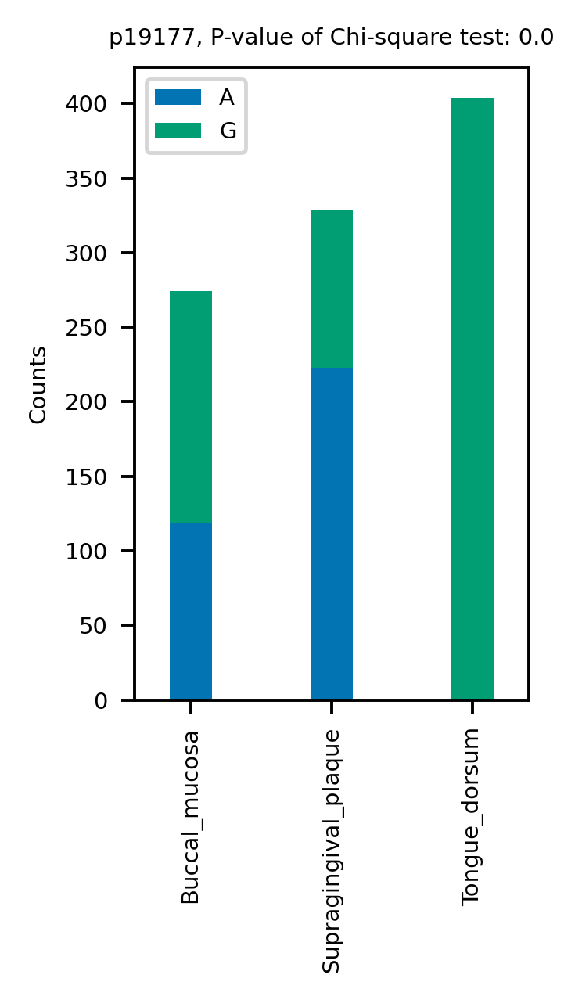

...

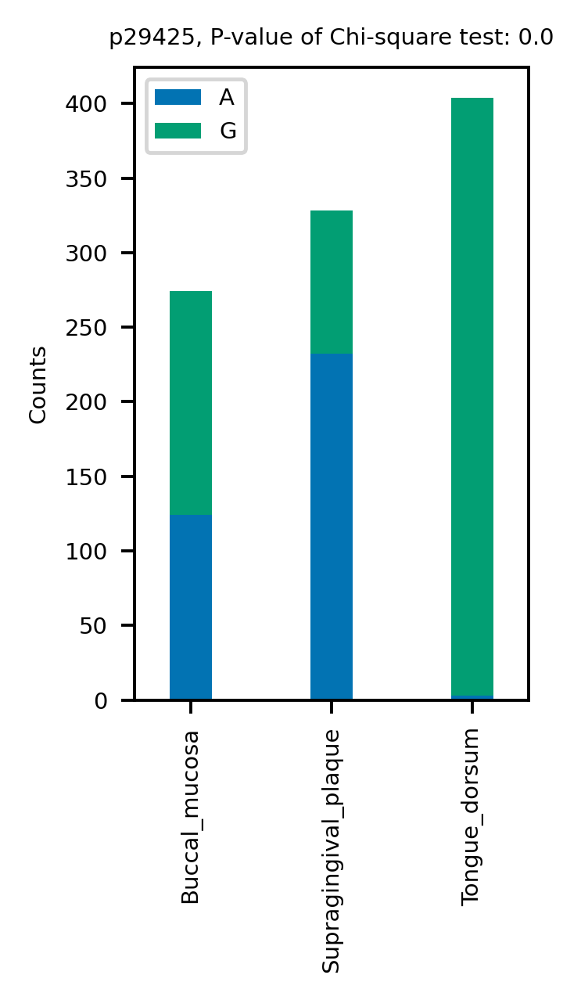

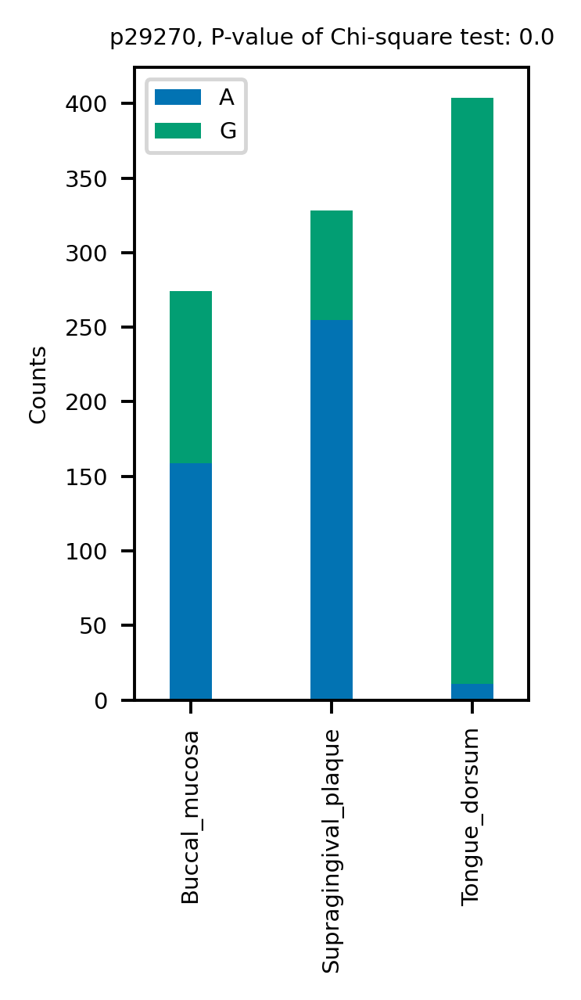

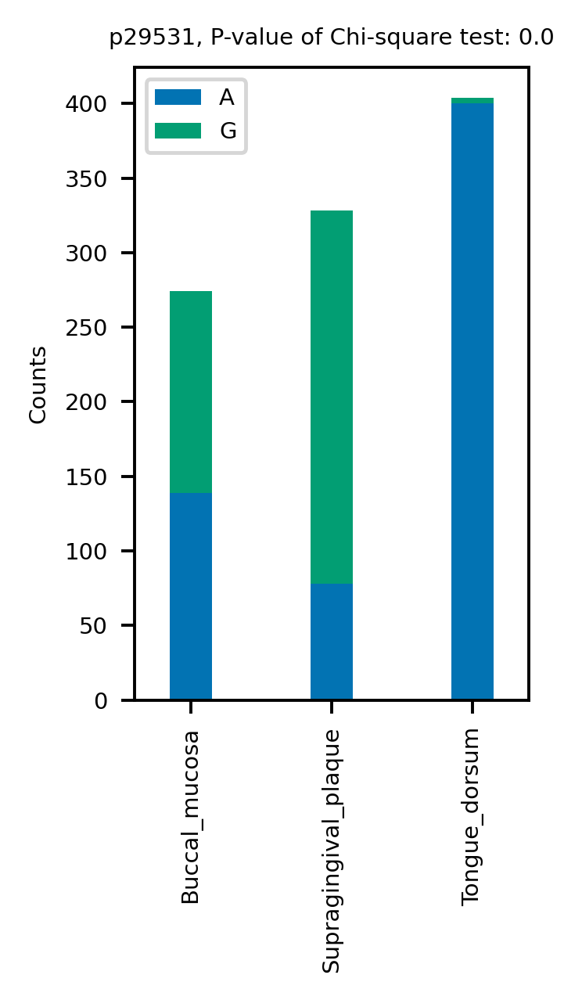

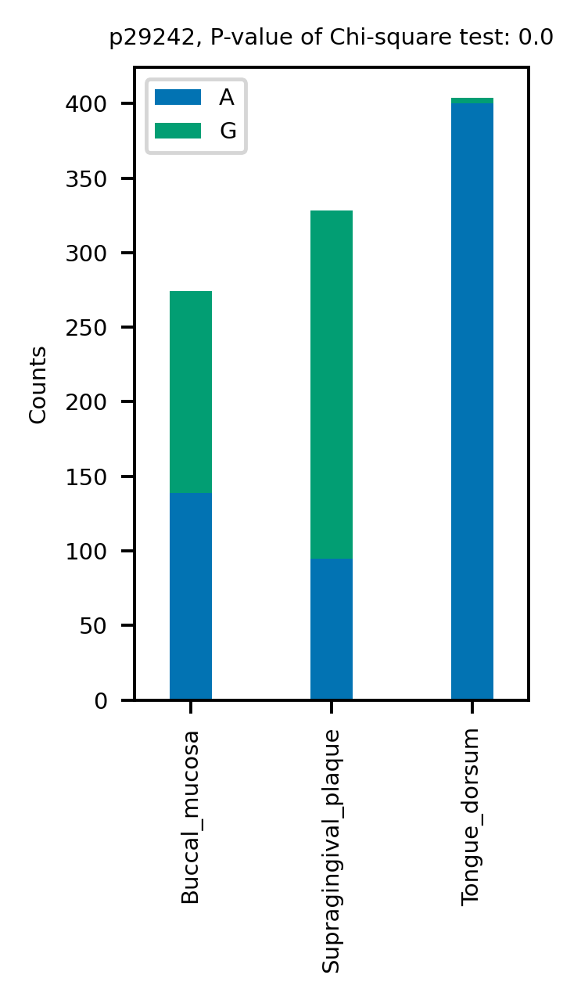

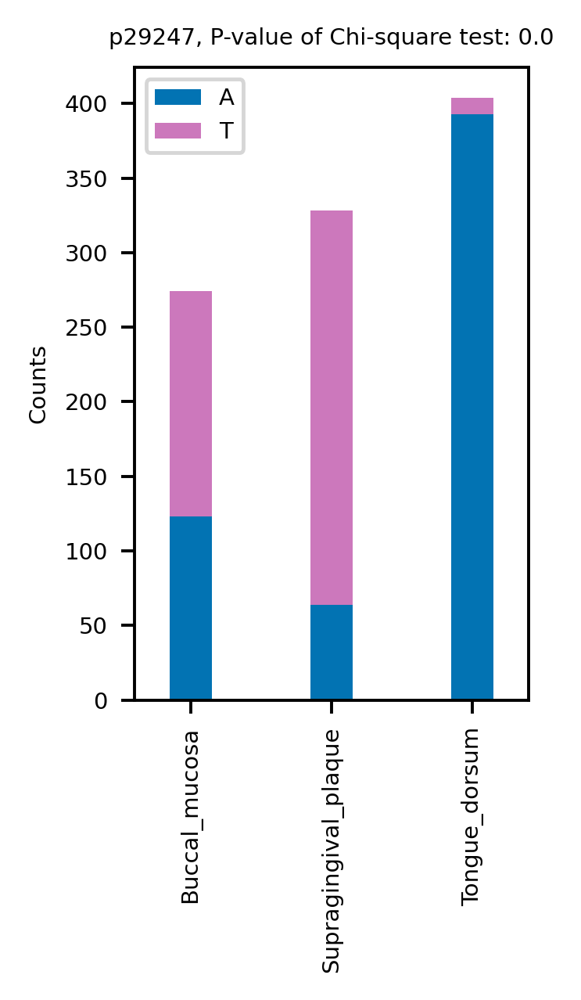

In [25]:
pl = plot_imp_all(final_models=top,
                  X_train=tr, y_train=y,
                  model_type = ana_type,
                  aggregate_function='max',
                  report_dir=report_dir, max_plots=150,
                  figsize=(1.86, 3))

In [27]:
import joblib
load_gbc = joblib.load(report_dir+'/gbc.pkl')

In [28]:
load_gbc

Pipeline(memory='/Users/mbagh/Documents/RahLab/deepBreaks_data/hmp/s__Haemophilus_parainfluenzae_Body_site_2023-05-10_23-18-22',
         steps=[('prep',
                 Pipeline(steps=[('mc', MisCare(missing_threshold=0.05)),
                                 ('cc', ConstantCare()),
                                 ('ur', URareCare(threshold=0.05)),
                                 ('cc2', ConstantCare()),
                                 ('one_hot', CustomOneHotEncoder()),
                                 ('feature_selection',
                                  FeatureSelection(alpha=0.25, keep=True,
                                                   model_type='cl')),
                                 ('collinear_care',
                                  CollinearCare(dist_method='correlation',
                                                keep=True, threshold=0.25))])),
                ('gbc', GradientBoostingClassifier(random_state=123))])